<a href="https://colab.research.google.com/github/cal-robinson/HAD7001_IntrotoML/blob/main/Cal_Robinson_HAD7001_Project_Phase_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import libraries**

In [2]:
!pip install category_encoders

In [9]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score
import warnings
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import TargetEncoder
from category_encoders import TargetEncoder
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import StandardScaler
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import RocCurveDisplay, auc, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
import statsmodels.api as sm
from scipy.stats import boxcox

warnings.filterwarnings('ignore')

**Import dataset**

In [176]:
from google.colab import files
import pandas as pd
import io
uploaded = files.upload()

data = pd.read_csv('ml_data.csv')

Saving ml_data.csv to ml_data (6).csv


**Data exploratation**

In [177]:
data
print(data.dtypes)
data.head(n=10)

sex                         int64
age_dx                    float64
fsa_rural                 float64
ethnicity                 float64
immigration               float64
education                 float64
employment                float64
income                    float64
term_delivery             float64
birthweight_g             float64
fhx_ns                      int64
fhx_kidney                  int64
pres_symp_any               int64
pres_symp_face_edema        int64
pres_symp_periph_edema      int64
pres_symp_abdo_dist         int64
pres_symp_wt_gain           int64
pres_symp_low_uop           int64
asthma                    float64
hayfever                  float64
eczema                    float64
isaac_score               float64
dx_month                    int64
hosp_dx                   float64
mean_sbp_percentile       float64
mean_dbp_percentile       float64
urine_heme                float64
urine_protein             float64
total25vitD               float64
hb            

,sex,age_dx,fsa_rural,ethnicity,immigration,education,employment,income,term_delivery,birthweight_g,...,sodium,urea,albumin,cholesterol,urine_acr,urine_pcr,egfr_u25,frsdns_1yr,rel1_1yr,ssm_2yr
0,1,8.194387,0.0,0.0,0.0,2.0,1.0,2.0,1.0,3231.84563,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1
1,1,1.552361,0.0,1.0,0.0,2.0,1.0,1.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1
2,1,3.800137,0.0,0.0,0.0,1.0,1.0,1.0,0.0,NaN,...,136.0,4.7,20.0,16.459999,NaN,NaN,95.2,1,1,1
3,1,9.894593,0.0,8.0,0.0,3.0,1.0,2.0,0.0,3572.03987,...,140.0,5.1,23.0,13.420000,NaN,NaN,104.2,1,1,1
4,0,2.373717,0.0,1.0,0.0,0.0,0.0,0.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1
5,1,2.767967,0.0,2.0,0.0,2.0,1.0,0.0,0.0,3033.39894,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0
6,1,2.464066,0.0,2.0,1.0,1.0,1.0,0.0,1.0,3300.00000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,1
7,0,4.405202,0.0,1.0,0.0,1.0,1.0,0.0,1.0,3203.49611,...,139.0,4.2,19.0,8.410000,NaN,NaN,106.0,0,1,1
8,0,7.156742,0.0,1.0,1.0,0.0,0.0,0.0,1.0,2500.00000,...,140.0,3.4,32.0,11.760000,NaN,NaN,96.1,0,0,0
9,1,2.759754,1.0,0.0,0.0,1.0,1.0,1.0,1.0,3401.94275,...,139.0,3.0,27.0,12.150000,NaN,NaN,94.2,1,1,1


In [6]:
pd.crosstab(data['frsdns_1yr'], columns='count')

col_0,count
frsdns_1yr,
0,287
1,197


**Missing data**

In [7]:
missing_data = print(data.isna())
missing_count = data.isna().sum()
print(missing_count)

       sex  age_dx  fsa_rural  ethnicity  immigration  education  employment  \
0    False   False      False      False        False      False       False   
1    False   False      False      False        False      False       False   
2    False   False      False      False        False      False       False   
3    False   False      False      False        False      False       False   
4    False   False      False      False        False      False       False   
..     ...     ...        ...        ...          ...        ...         ...   
479  False   False      False      False        False      False        True   
480  False   False      False      False        False      False        True   
481  False   False      False      False        False      False        True   
482  False   False      False      False        False      False        True   
483  False   False      False      False        False      False        True   

     income  term_delivery  birthweight

**Data class imbalance and distributions for outliers**

Class imbalance in 'sex':
sex
1    0.628099
0    0.371901
Name: proportion, dtype: float64


Class imbalance in 'fsa_rural':
fsa_rural
0.0    0.956897
1.0    0.043103
Name: proportion, dtype: float64


Class imbalance in 'ethnicity':
ethnicity
1.0    0.356522
0.0    0.236957
8.0    0.152174
2.0    0.117391
4.0    0.052174
5.0    0.043478
3.0    0.023913
6.0    0.015217
7.0    0.002174
Name: proportion, dtype: float64


Class imbalance in 'immigration':
immigration
0.0    0.850877
1.0    0.149123
Name: proportion, dtype: float64


Class imbalance in 'education':
education
1.0    0.380744
2.0    0.319475
3.0    0.245077
0.0    0.054705
Name: proportion, dtype: float64


Class imbalance in 'income':
income
2.0    0.368263
1.0    0.323353
0.0    0.308383
Name: proportion, dtype: float64


Class imbalance in 'term_delivery':
term_delivery
1.0    0.86637
0.0    0.13363
Name: proportion, dtype: float64


Class imbalance in 'fhx_ns':
fhx_ns
0    0.977273
1    0.022727
Name: proportion, dtype: 

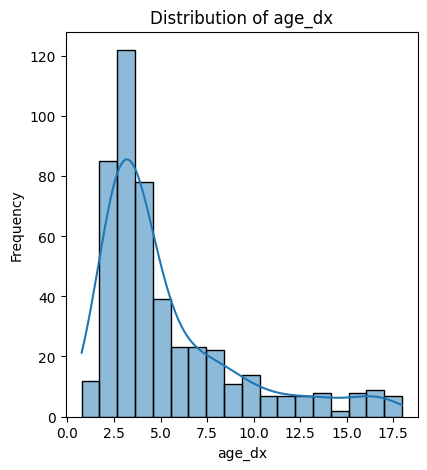

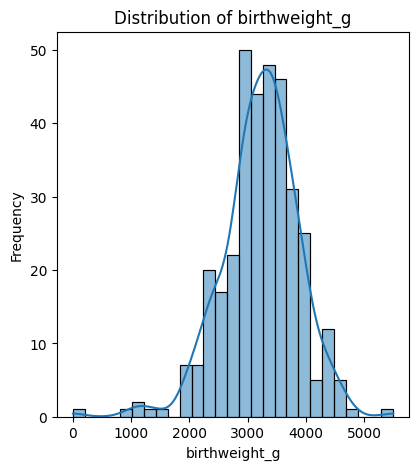

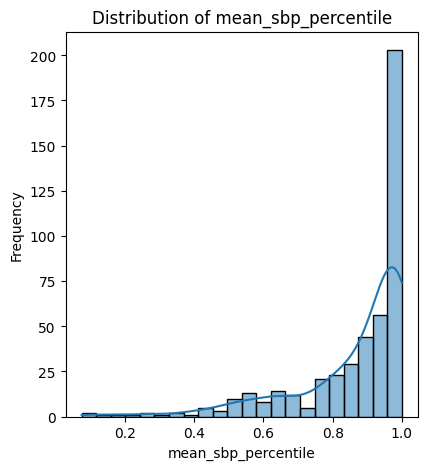

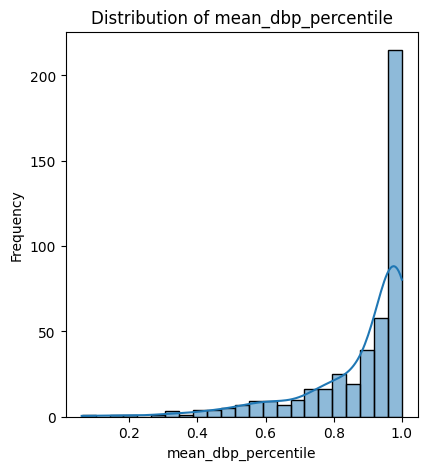

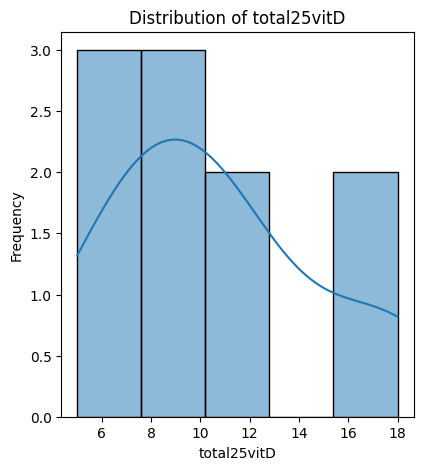

...

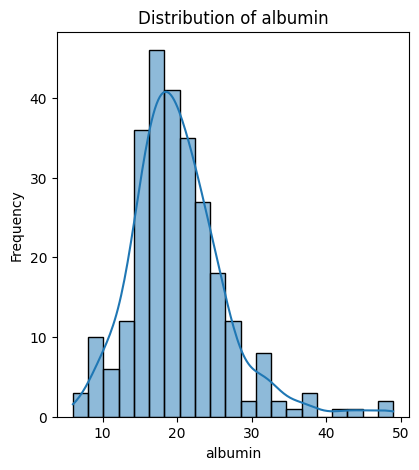

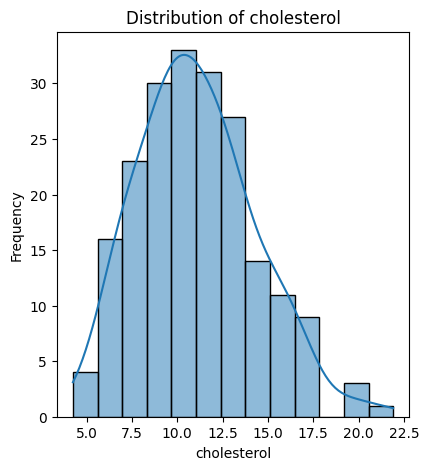

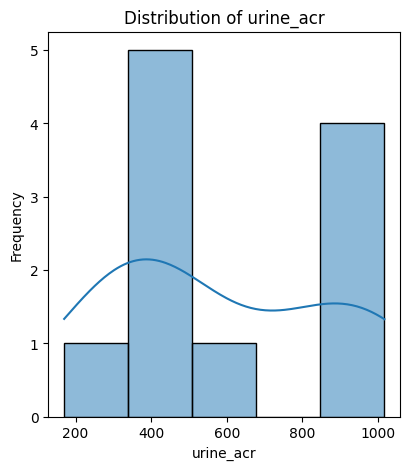

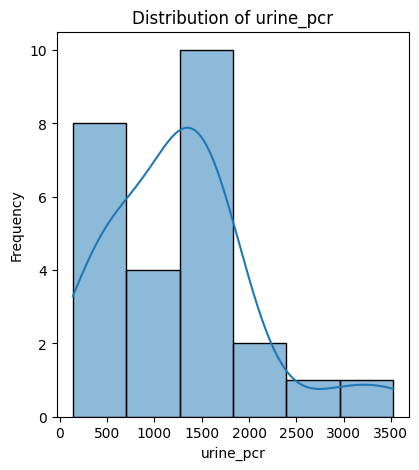

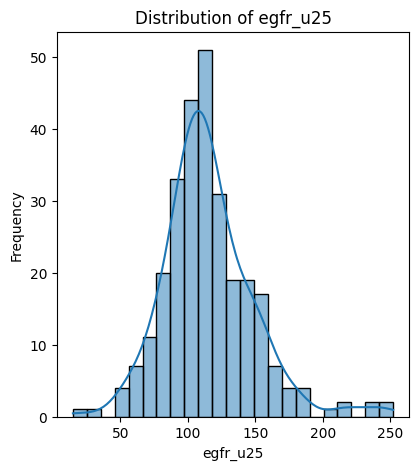

<Figure size 800x600 with 0 Axes>

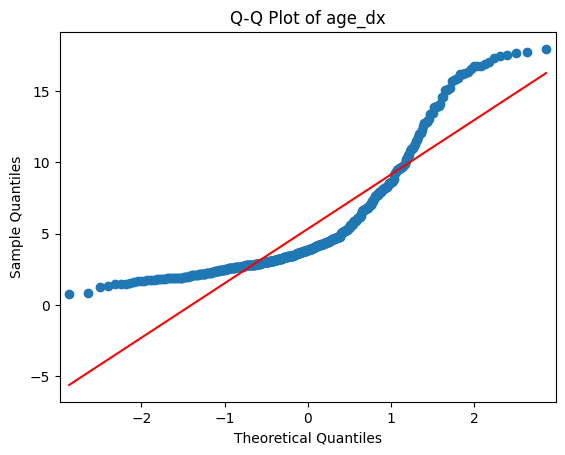

<Figure size 800x600 with 0 Axes>

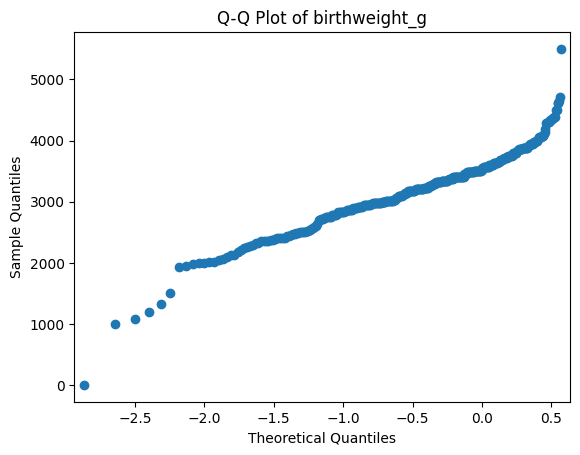

<Figure size 800x600 with 0 Axes>

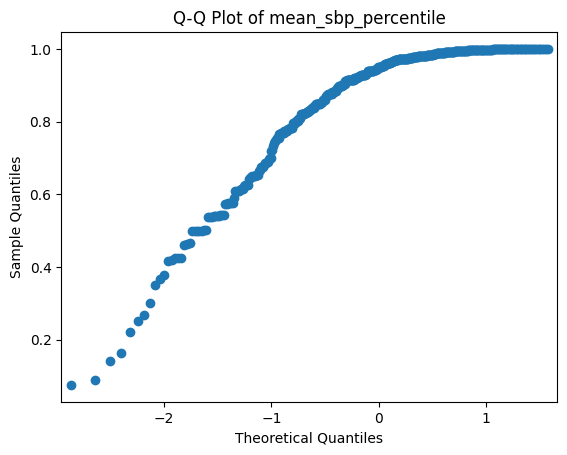

<Figure size 800x600 with 0 Axes>

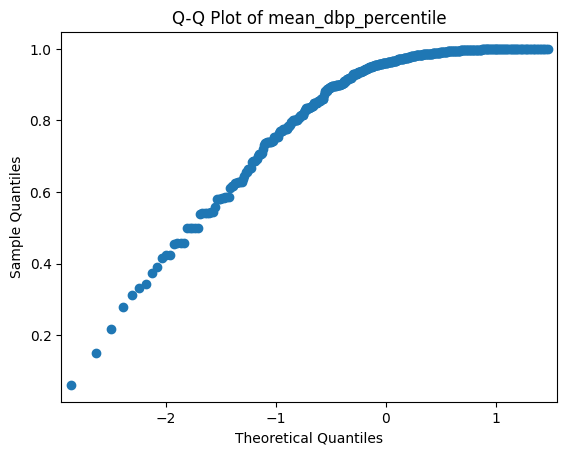

<Figure size 800x600 with 0 Axes>

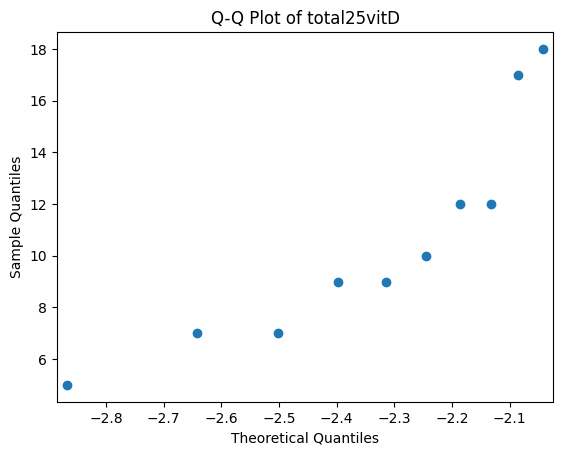

<Figure size 800x600 with 0 Axes>

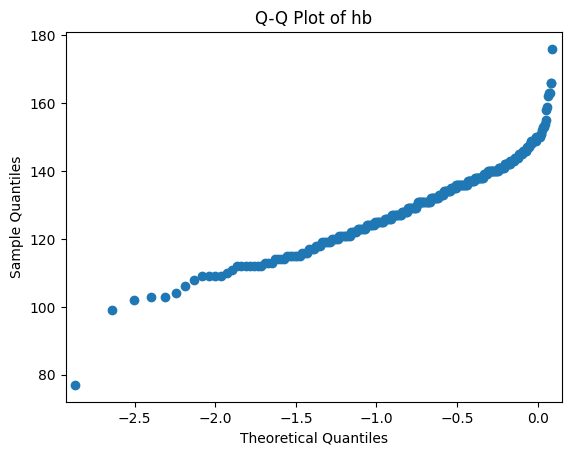

<Figure size 800x600 with 0 Axes>

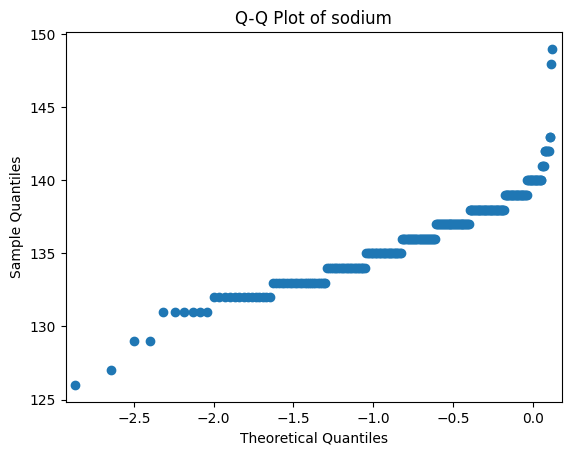

<Figure size 800x600 with 0 Axes>

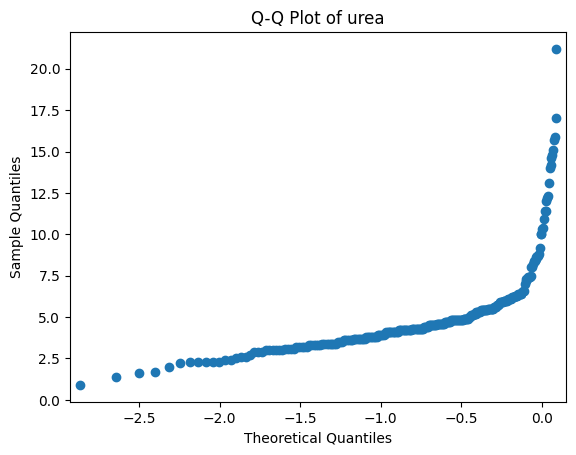

<Figure size 800x600 with 0 Axes>

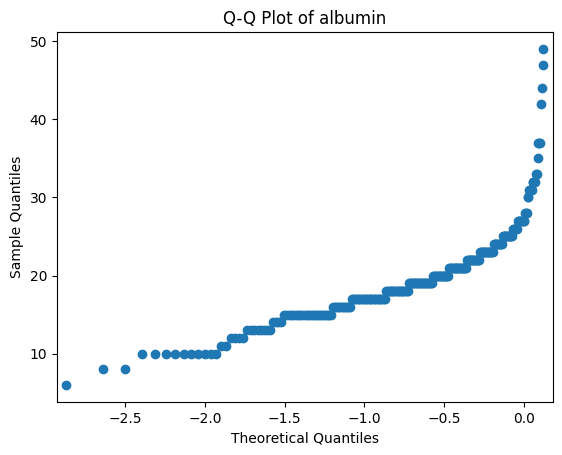

<Figure size 800x600 with 0 Axes>

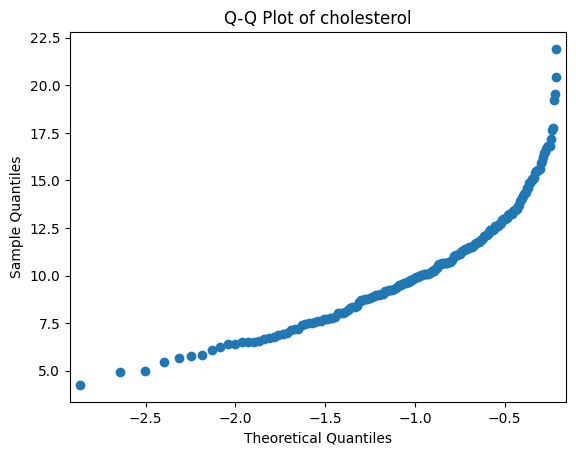

<Figure size 800x600 with 0 Axes>

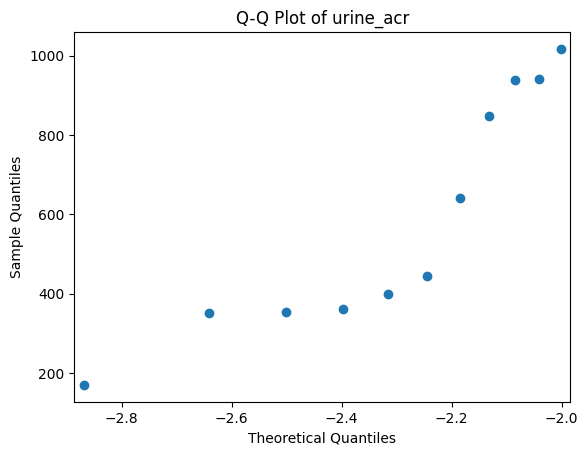

<Figure size 800x600 with 0 Axes>

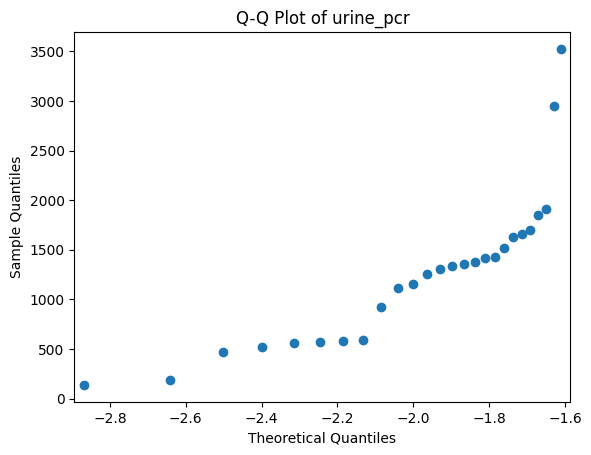

<Figure size 800x600 with 0 Axes>

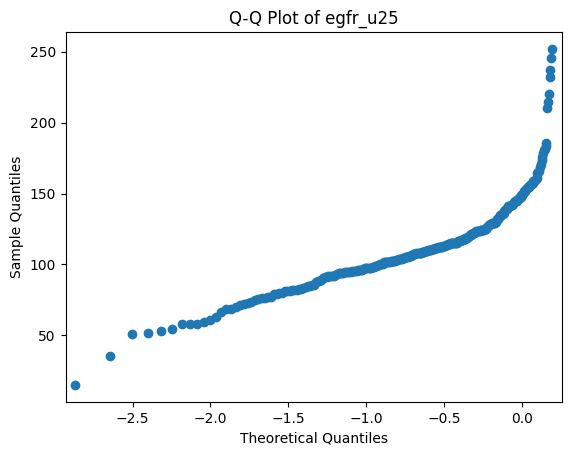

In [10]:
# Check for class imbalance for categorical variables
def check_class_imbalance(data, target_variable):
  class_counts = data[target_variable].value_counts(normalize=True)
  return class_counts

categorical_vars = ['sex', 'fsa_rural', 'ethnicity', 'immigration', 'education', 'income', 'term_delivery', 'fhx_ns', 'fhx_kidney', 'pres_symp_any', 'pres_symp_face_edema', 'pres_symp_periph_edema', 'pres_symp_abdo_dist', 'pres_symp_wt_gain', 'pres_symp_low_uop', 'asthma', 'hayfever', 'eczema', 'isaac_score', 'dx_month', 'hosp_dx', 'urine_heme', 'urine_protein', 'frsdns_1yr', 'rel1_1yr', 'ssm_2yr']

# Loop through all variables and check for class imbalance
for variable in categorical_vars:
    try:
        imbalance_report = check_class_imbalance(data, variable)
        print(f"Class imbalance in '{variable}':")
        print(imbalance_report)
        print("\n")  # Add a separator between variables
    except KeyError:
        print(f"Variable '{variable}' skipped (likely not categorical).")
        print("\n")

# Assess distribution of continuous variables
continuous_vars = ['age_dx', 'birthweight_g', 'mean_sbp_percentile', 'mean_dbp_percentile', 'total25vitD', 'hb', 'sodium', 'urea', 'albumin', 'cholesterol', 'urine_acr', 'urine_pcr', 'egfr_u25']

for var in continuous_vars:
    plt.figure(figsize=(10, 5))  # Adjust figure size if needed

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[var], kde=True)  # kde adds a kernel density estimate
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')

# Assess distribution of residuals
for var in continuous_vars:
    plt.figure(figsize=(8, 6))

    # Q-Q plot
    sm.qqplot(data[var], line='s')  # 's' for standardized line
    plt.title(f'Q-Q Plot of {var}')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')

    plt.show()

**Descriptive data**

Overall cohort

In [179]:
print(data.describe())

              sex      age_dx   fsa_rural   ethnicity  immigration  \
count  484.000000  484.000000  464.000000  460.000000   456.000000   
mean     0.628099    5.336116    0.043103    2.413043     0.149123   
std      0.483812    3.815662    0.203309    2.747755     0.356601   
min      0.000000    0.766598    0.000000    0.000000     0.000000   
25%      0.000000    2.817248    0.000000    1.000000     0.000000   
50%      1.000000    3.854894    0.000000    1.000000     0.000000   
75%      1.000000    6.648871    0.000000    4.000000     0.000000   
max      1.000000   17.963039    1.000000    8.000000     1.000000   

        education  employment      income  term_delivery  birthweight_g  ...  \
count  457.000000  406.000000  334.000000     449.000000     347.000000  ...   
mean     1.754923    0.738916    1.059880       0.866370    3227.061151  ...   
std      0.886734    0.439767    0.821634       0.340634     649.580960  ...   
min      0.000000    0.000000    0.000000       0

Stratified by FRSDNS classification at 1-year

In [245]:
descriptivegroup = data.groupby('frsdns_1yr').mean()
print(descriptivegroup)

descriptivesd = data.groupby('frsdns_1yr').std()
print(descriptivesd)

freq_sex = pd.crosstab(data['sex'], data['frsdns_1yr'])
print(freq_sex)

freq_rural = pd.crosstab(data['fsa_rural'], data['frsdns_1yr'])
print(freq_rural)

freq_ethnic = pd.crosstab(data['ethnicity'], data['frsdns_1yr'])
print(freq_ethnic)

freq_immigrant = pd.crosstab(data['immigration'], data['frsdns_1yr'])
print(freq_immigrant)

freq_educ = pd.crosstab(data['education'], data['frsdns_1yr'])
print(freq_educ)

freq_income = pd.crosstab(data['income'], data['frsdns_1yr'])
print(freq_income)

freq_termdel = pd.crosstab(data['term_delivery'], data['frsdns_1yr'])
print(freq_termdel)

freq_fhx_ns = pd.crosstab(data['fhx_ns'], data['frsdns_1yr'])
print(freq_fhx_ns)

freq_fhx_kidney = pd.crosstab(data['fhx_kidney'], data['frsdns_1yr'])
print(freq_fhx_kidney)

freq_symptoms = pd.crosstab(data['pres_symp_any'], data['frsdns_1yr'])
print(freq_symptoms)

freq_asthma = pd.crosstab(data['asthma'], data['frsdns_1yr'])
print(freq_asthma)

freq_hayfever = pd.crosstab(data['hayfever'], data['frsdns_1yr'])
print(freq_hayfever)

freq_eczema = pd.crosstab(data['eczema'], data['frsdns_1yr'])
print(freq_eczema)

freq_isaac_score = pd.crosstab(data['isaac_score'], data['frsdns_1yr'])
print(freq_isaac_score)

freq_dx_month = pd.crosstab(data['dx_month'], data['frsdns_1yr'])
print(freq_dx_month)

freq_hosp_dx = pd.crosstab(data['hosp_dx'], data['frsdns_1yr'])
print(freq_hosp_dx)

freq_urine_heme = pd.crosstab(data['urine_heme'], data['frsdns_1yr'])
print(freq_urine_heme)

freq_urine_protein = pd.crosstab(data['urine_protein'], data['frsdns_1yr'])
print(freq_urine_protein)


                 sex    age_dx  fsa_rural  ethnicity  immigration  education  \
frsdns_1yr                                                                     
0           0.627178  5.702333   0.037175   2.456929     0.162879   1.791667   
1           0.629442  4.802593   0.051282   2.352332     0.130208   1.704663   

            employment    income  term_delivery  birthweight_g  ...  \
frsdns_1yr                                                      ...   
0             0.734440  1.072917       0.854406    3203.289040  ...   
1             0.745455  1.042254       0.882979    3261.380043  ...   

                    hb      sodium      urea    albumin  cholesterol  \
frsdns_1yr                                                             
0           132.134146  136.521212  5.287805  20.287425    10.721667   
1           131.354167  136.108911  5.404167  20.050505    11.584634   

             urine_acr    urine_pcr    egfr_u25  rel1_1yr   ssm_2yr  
frsdns_1yr                         

**Feature correlation**

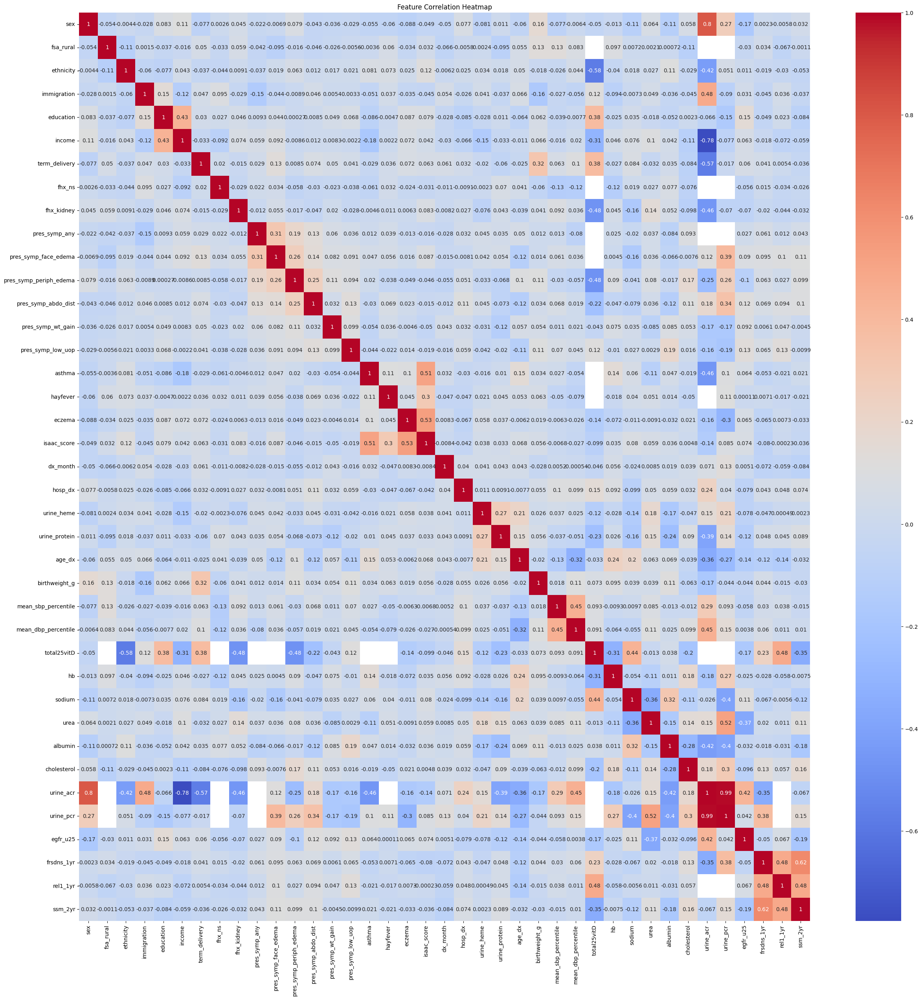

In [13]:
corr_data = pd.DataFrame(data, columns=['sex', 'fsa_rural', 'ethnicity', 'immigration', 'education', 'income', 'term_delivery', 'fhx_ns', 'fhx_kidney', 'pres_symp_any', 'pres_symp_face_edema', 'pres_symp_periph_edema', 'pres_symp_abdo_dist', 'pres_symp_wt_gain', 'pres_symp_low_uop', 'asthma', 'hayfever', 'eczema', 'isaac_score', 'dx_month', 'hosp_dx', 'urine_heme', 'urine_protein', 'age_dx', 'birthweight_g', 'mean_sbp_percentile', 'mean_dbp_percentile', 'total25vitD', 'hb', 'sodium', 'urea', 'albumin', 'cholesterol', 'urine_acr', 'urine_pcr', 'egfr_u25', 'frsdns_1yr', 'rel1_1yr', 'ssm_2yr'])

plt.figure(figsize=(30,30))
sns.heatmap(corr_data.corr(), annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

Data visualization with pair plot

In [14]:
sns.pairplot(data, hue='frsdns_1yr', palette="magma")
plt.show()

**Data preparation for analysis**

In [11]:
list(data.columns)

['sex',
 'age_dx',
 'fsa_rural',
 'ethnicity',
 'immigration',
 'education',
 'employment',
 'income',
 'term_delivery',
 'birthweight_g',
 'fhx_ns',
 'fhx_kidney',
 'pres_symp_any',
 'pres_symp_face_edema',
 'pres_symp_periph_edema',
 'pres_symp_abdo_dist',
 'pres_symp_wt_gain',
 'pres_symp_low_uop',
 'asthma',
 'hayfever',
 'eczema',
 'isaac_score',
 'dx_month',
 'hosp_dx',
 'mean_sbp_percentile',
 'mean_dbp_percentile',
 'urine_heme',
 'urine_protein',
 'total25vitD',
 'hb',
 'sodium',
 'urea',
 'albumin',
 'cholesterol',
 'urine_acr',
 'urine_pcr',
 'egfr_u25',
 'frsdns_1yr',
 'rel1_1yr',
 'ssm_2yr']

Urine PCR, urine ACR, and vitamin D variables dropped due to high missingness (>90%) and secondary outcomes

In [12]:
data.drop(['urine_acr', 'urine_pcr', 'total25vitD','rel1_1yr', 'ssm_2yr'], axis=1, inplace=True)

In [13]:
# Define a function to preprocess and transform input data (for our training set)
def fit_and_transform_trainingset(data):

      imputer = IterativeImputer(max_iter=10, random_state=1)
      st_x = StandardScaler()

    # Perform imputation and standardization on the feature matrix
      X = imputer.fit_transform(data.drop('frsdns_1yr', axis=1).to_numpy())
      X = st_x.fit_transform(X)

    # Extract the target variable
      y = data['frsdns_1yr'].to_numpy()

    # Return the preprocessed feature matrix, target variable, and transformers/imputers
      return X, y, imputer, st_x

In [14]:
# Define a function to transform new data using pre-trained transformers and imputers (for our test set)
def transform_testset(data, imputer, st_x):

    X = imputer.transform(data.drop('frsdns_1yr', axis=1).to_numpy())
    X = st_x.transform(X)

    # Return the transformed feature matrix
    return X

Splitting into train (70%) and test (30%) datasets

In [15]:
# Splitting the dataset into training and test sets
train = data.sample(frac=0.7, random_state=10)  # 70% for training
test = data.drop(train.index)  # Remaining data for testing

# Feature engineering and preprocessing on the training set
X_train, Y_train, imputer, st_x = fit_and_transform_trainingset(train)

# Preprocess and transform the test set
X_test = transform_testset(test, imputer, st_x)
Y_test = test['frsdns_1yr'].to_numpy()

**Model performance functions**

In [16]:
# Define a function to compute and visualize various scores for model evaluation
def get_scores(Y, Y_pred):
    # Calculate confusion matrix, classification report, and accuracy
    conf_matrix = confusion_matrix(Y, Y_pred)
    class_report = classification_report(Y, Y_pred)
    acc = accuracy_score(Y, Y_pred)
    # Return the computed scores
    return conf_matrix, class_report, acc #returns confusion matrix, class report, and accuracy values

# Define a function to print the computed scores
def print_our_scores(conf_matrix, class_report, acc) -> None:
    print('Accuracy : ', acc)
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

#Define a function to visualize a confusion matrix
def plot_confusion_matrix(conf_matrix) -> None: #enter the confuction matric
    sns.heatmap(conf_matrix, annot=True, fmt='d')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

#Define a function to get values for AUC plot
def get_auc_values(Y_prob, Y): #enter the predicted probability and the actual classification
    roc_auc = roc_auc_score(Y, Y_prob)
    fpr, tpr, thresholds = roc_curve(Y, Y_prob)
    return fpr, tpr, roc_auc #returns false positive rate, true positive rate, and roc_auc value

#Define a function to plot the AUC_ROC curve
def plot_roc_curve(fpr, tpr, roc_auc, title: str = 'ROC AUC Curve'): #you can also add a title (str format), by default the title will be ROC AUC Curve
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

**Model 1 - unpenalized logistic regression**

======== Training Set ==========
Accuracy :  0.6578171091445427
Confusion Matrix:
[[159  38]
 [ 78  64]]

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.81      0.73       197
           1       0.63      0.45      0.52       142

    accuracy                           0.66       339
   macro avg       0.65      0.63      0.63       339
weighted avg       0.65      0.66      0.65       339



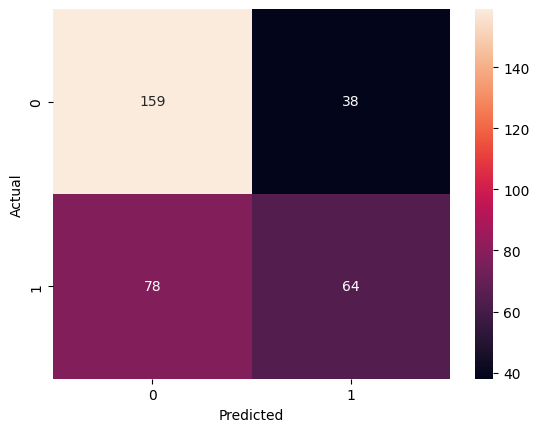

Training AUC: 0.6902


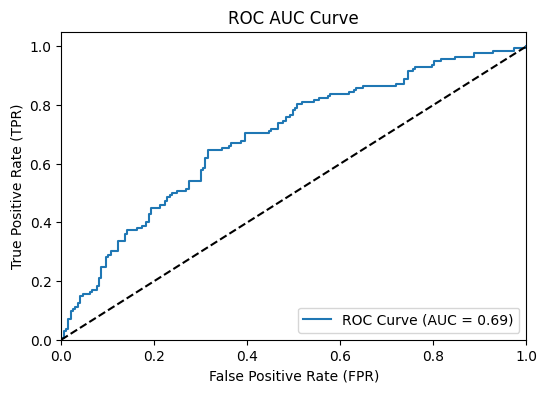

======== Test Set ==========
Accuracy :  0.5310344827586206
Confusion Matrix:
[[61 29]
 [39 16]]

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.68      0.64        90
           1       0.36      0.29      0.32        55

    accuracy                           0.53       145
   macro avg       0.48      0.48      0.48       145
weighted avg       0.51      0.53      0.52       145



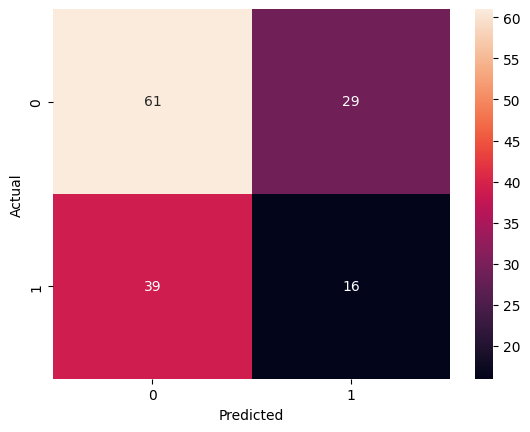

Testing AUC: 0.4804


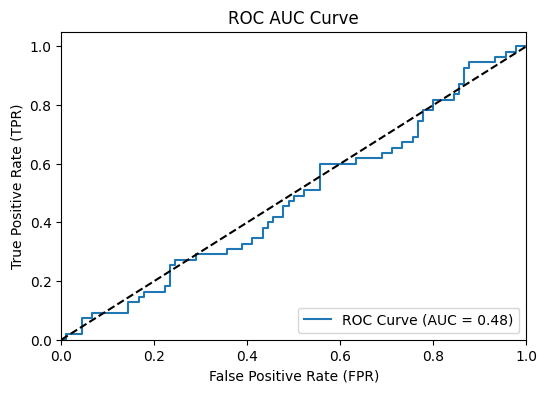

In [17]:
# Initialize and train a logistic regression model
model = LogisticRegression()
model.fit(X_train, Y_train)

# Make predictions on the training and testing sets, also get the prediction probabilities to calculate ROC-AUC
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
y_prob_train = model.predict_proba(X_train)[:, 1]
y_prob_test = model.predict_proba(X_test)[:, 1]

### Evaluate Model Performance ----------------------------------------------------------------------------------------

# Make predictions on the training and testing sets, also get the prediction probabilities to calculate ROC-AUC
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
y_prob_train = model.predict_proba(X_train)[:, 1]
y_prob_test = model.predict_proba(X_test)[:, 1]

# Calculate evaluation metrics and scores for the test and training sets
conf_matrix_train, class_report_train, acc_train = get_scores(Y_train, y_pred_train)
conf_matrix_test, class_report_test, acc_test = get_scores(Y_test, y_pred_test)

# Print scores and evaluation metrics for the training set
print('======== Training Set ==========')
print_our_scores(conf_matrix_train, class_report_train, acc_train)
plot_confusion_matrix(conf_matrix_train) # plot the confusion matrix for the training set using the function we created above

fpr_train, tpr_train, roc_auc_train = get_auc_values(y_prob_train, Y_train)
print(f"Training AUC: {roc_auc_train:.4f}")
plot_roc_curve(fpr_train, tpr_train, roc_auc_train)

# Print scores and evaluation metrics for the test set
print('======== Test Set ==========')
print_our_scores(conf_matrix_test, class_report_test, acc_test)
plot_confusion_matrix(conf_matrix_test) # plot the confusion matrix for the test set using the function we created above

fpr_test, tpr_test, roc_auc_test = get_auc_values(y_prob_test, Y_test)
print(f"Testing AUC: {roc_auc_test:.4f}")
plot_roc_curve(fpr_test, tpr_test, roc_auc_test)

**Model 1 - Unpenalized logistic regression summary**

In [18]:
# Logistic regression - no penalization model summary

X = data[['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]
y = data['frsdns_1yr']

imputer_sum = IterativeImputer(max_iter=10, random_state=1)
X = imputer_sum.fit_transform(X)

scaler = StandardScaler()
X = scaler.fit_transform(X)

# Add a constant term for the intercept
X = sm.add_constant(X)

# Create and fit logistic regression model
log_reg = sm.Logit(y, X).fit()

# Get summary report
summary = log_reg.summary()
print(summary)

KeyError: "['total25vitD'] not in index"

**Model 1 - Validation and feature selection**

K-fold cross validation

In [175]:
# Define a function to run k-fold cross-validation for logistic regression
def run_kfold_regression(data_x, data_y, k):
    mean_train_loss = 0
    mean_validation_loss = 0

    kfold = KFold(n_splits=k, shuffle=True)
    for train_indexes, validation_indexes in kfold.split(data_x):
        k_fold_train_x = data_x[train_indexes]
        k_fold_train_y = data_y[train_indexes]
        validation_x = data_x[validation_indexes]
        validation_y = data_y[validation_indexes]

        model = LogisticRegression()
        model.fit(k_fold_train_x, k_fold_train_y)

        train_y_hat = model.predict(k_fold_train_x)
        train_mse = mean_squared_error(k_fold_train_y, train_y_hat)
        mean_train_loss += train_mse

        validation_y_hat = model.predict(validation_x)
        validation_mse = mean_squared_error(validation_y, validation_y_hat)
        mean_validation_loss += validation_mse

    mean_train_loss /= k
    mean_validation_loss /= k

    return mean_train_loss, mean_validation_loss

# Initialize lists to store model complexity, train loss, and validation loss
model_complexity_list = []
train_loss_list = []
validation_loss_list = []

# Loop over different model complexities
for model_complexity in range(1, 20):
    data_x = np.hstack([X_train**i for i in range(1, model_complexity+1)])
    data_y = Y_train

    # Run k-fold cross-validation and compute train and validation losses
    train_loss, validation_loss = run_kfold_regression(data_x, data_y, 20)

    model_complexity_list.append(model_complexity)
    train_loss_list.append(train_loss)
    validation_loss_list.append(validation_loss)

KeyError: '[3, 4, 8, 11, 13, 14, 15, 16, 18, 23, 31, 33, 40, 41, 42, 45, 51, 53, 54, 62, 67, 71, 73, 74, 77, 85, 89, 90, 93, 94, 96, 112, 118, 122, 123, 125, 128, 133, 134, 135, 140, 141, 143, 144, 145, 150, 156, 158, 159, 165, 177, 178, 179, 182, 185, 200, 201, 209, 216, 220, 221, 232, 234, 235, 237, 239, 243, 246, 248, 250, 254, 256, 265, 268, 271, 272, 273, 283, 284, 285, 286, 289, 290, 292, 313, 320, 321, 322, 337, 338] not in index'

<Axes: xlabel='complexity', ylabel='loss'>

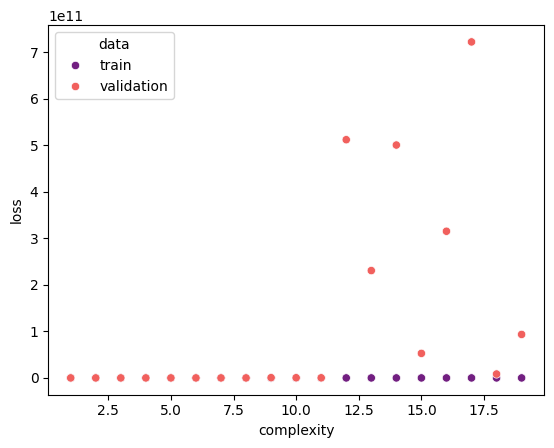

In [20]:
# Create validation data combining training and validation metrics
validation_data = {
    'complexity': model_complexity_list + model_complexity_list,
    'loss': train_loss_list + validation_loss_list,
    'data': ['train'] * len(train_loss_list) + ['validation'] * len(train_loss_list)
}

# Create a DataFrame from the validation data
validation_df = pd.DataFrame(validation_data)

# Create a scatterplot with seaborn, changing the color scheme
sns.scatterplot(data=validation_df, x='complexity', y='loss', hue='data', palette='magma')

**Model 2 - Logistic regression with recursive feature selection**

In [21]:
# Split the data into training and testing sets
train = data.sample(frac=0.7, random_state=1)
test = data.drop(train.index)

# Preprocess and transform the training and test sets
X_train, Y_train, imputer, st_x = fit_and_transform_trainingset(train)
X_test = transform_testset(test, imputer, st_x)
Y_test = test['frsdns_1yr'].to_numpy()

# Initialize a Logistic Regression model
model = LogisticRegression()

# Define a StratifiedKFold cross-validation
cv = StratifiedKFold(3)

# Initialize Recursive Feature Elimination with Cross-Validation (RFECV)
rfecv = RFECV(
    estimator=model,
    step=1,
    cv=cv,
    scoring='roc_auc',  # Specify the scoring metric (ROC AUC in this case)
    min_features_to_select=1,
)
rfecv.fit(X_train, Y_train)

# Print the optimal number of selected features
print(f"Optimal number of features: {rfecv.n_features_}")

Optimal number of features: 3


In [22]:
rfecv.support_

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False,  True])

In [23]:
data.columns[list(rfecv.support_) + [True]]

Index(['pres_symp_face_edema', 'dx_month', 'egfr_u25', 'frsdns_1yr'], dtype='object')

In [24]:
rfecv.ranking_

array([ 8,  2, 16, 11,  6,  9, 32, 23,  3, 28, 29, 18, 22,  1, 20, 21, 24,
       12, 30,  4,  5, 19,  1, 26,  7, 25, 14, 15, 17, 13, 10, 31, 27,  1])

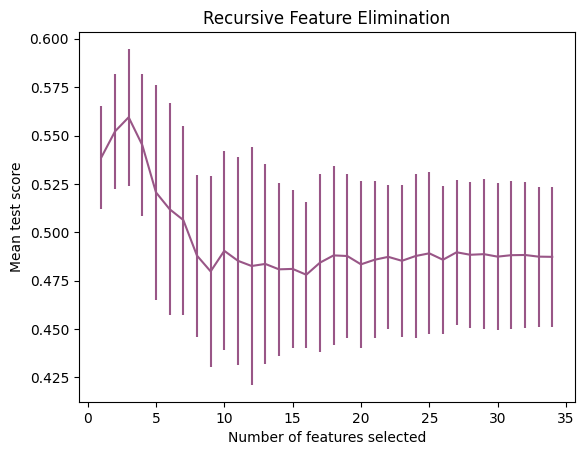

In [25]:
# Calculate the number of different feature selections tested
n_scores = len(rfecv.cv_results_["mean_test_score"])

# Create a new figure for plotting
plt.figure()

# Set labels for the x and y axes
plt.xlabel("Number of features selected")
plt.ylabel("Mean test score")

# Plot the mean test scores with error bars
plt.errorbar(
    range(1, n_scores + 1),
    rfecv.cv_results_["mean_test_score"],
    yerr=rfecv.cv_results_["std_test_score"],
    color='#995687'  # Change the color to green
)

# Set the title for the plot
plt.title("Recursive Feature Elimination")

# Show the plot
plt.show()

======== Training Set ==========
Accuracy :  0.6047197640117994
Confusion Matrix:
[[164  34]
 [100  41]]

Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.83      0.71       198
           1       0.55      0.29      0.38       141

    accuracy                           0.60       339
   macro avg       0.58      0.56      0.54       339
weighted avg       0.59      0.60      0.57       339



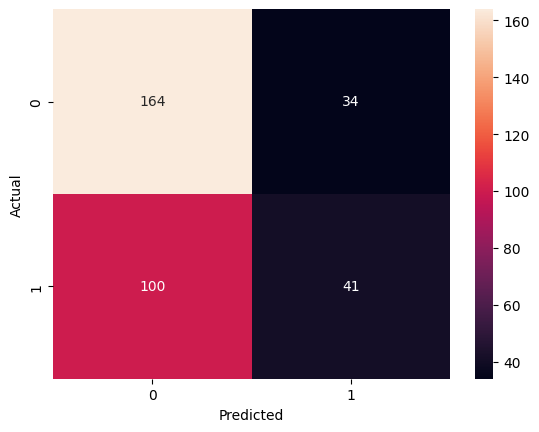

Training AUC: 0.6294


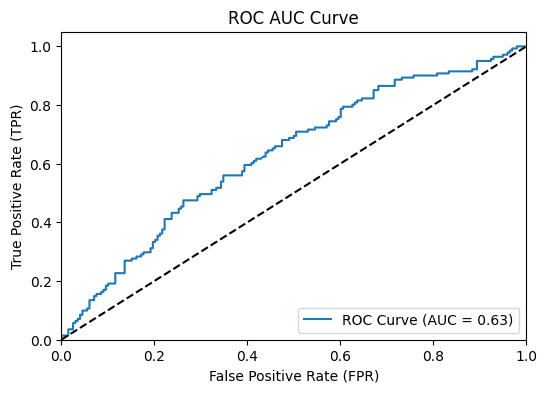

======== Test Set ==========
Accuracy :  0.5241379310344828
Confusion Matrix:
[[68 21]
 [48  8]]

Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.76      0.66        89
           1       0.28      0.14      0.19        56

    accuracy                           0.52       145
   macro avg       0.43      0.45      0.43       145
weighted avg       0.47      0.52      0.48       145



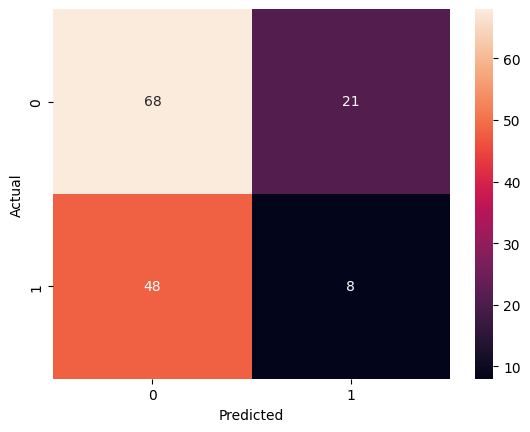

Testing AUC: 0.4422


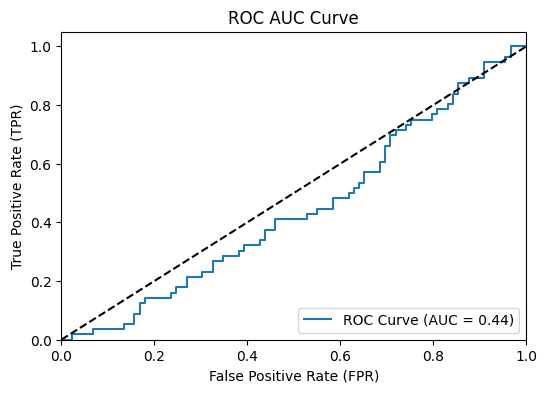

In [26]:
# Select only the features that were chosen by RFECV
X_train = X_train[:, rfecv.support_]
X_test = X_test[:, rfecv.support_]

# Initialize and train a logistic regression model
model = LogisticRegression()
model.fit(X_train, Y_train)

# Make predictions on the training and testing sets, also get the prediction probabilities to calculate ROC-AUC
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
y_prob_train = model.predict_proba(X_train)[:, 1]
y_prob_test = model.predict_proba(X_test)[:, 1]

### Evaluate Model Performance ----------------------------------------------------------------------------------------

# Make predictions on the training and testing sets, also get the prediction probabilities to calculate ROC-AUC
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
y_prob_train = model.predict_proba(X_train)[:, 1]
y_prob_test = model.predict_proba(X_test)[:, 1]

# Calculate evaluation metrics and scores for the test and training sets
conf_matrix_train, class_report_train, acc_train = get_scores(Y_train, y_pred_train)
conf_matrix_test, class_report_test, acc_test = get_scores(Y_test, y_pred_test)

# Print scores and evaluation metrics for the training set
print('======== Training Set ==========')
print_our_scores(conf_matrix_train, class_report_train, acc_train)
plot_confusion_matrix(conf_matrix_train) # plot the confusion matrix for the training set using the function we created above

fpr_train, tpr_train, roc_auc_train = get_auc_values(y_prob_train, Y_train)
print(f"Training AUC: {roc_auc_train:.4f}")
plot_roc_curve(fpr_train, tpr_train, roc_auc_train)

# Print scores and evaluation metrics for the test set
print('======== Test Set ==========')
print_our_scores(conf_matrix_test, class_report_test, acc_test)
plot_confusion_matrix(conf_matrix_test) # plot the confusion matrix for the test set using the function we created above

fpr_test, tpr_test, roc_auc_test = get_auc_values(y_prob_test, Y_test)
print(f"Testing AUC: {roc_auc_test:.4f}")
plot_roc_curve(fpr_test, tpr_test, roc_auc_test)

**Model 3 - L1 penalized logistic regression**

With L1 penalization (to simplify model given many features with minimal correlation with outcome)

In [27]:
# Splitting the dataset into training and test sets
train = data.sample(frac=0.7, random_state=10)
test = data.drop(train.index)

# Feature engineering and preprocessing on the training set
X_train, Y_train, imputer, st_x = fit_and_transform_trainingset(train)

# Preprocess and transform the test set
X_test = transform_testset(test, imputer, st_x)
Y_test = test['frsdns_1yr'].to_numpy()

In [29]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

In [30]:
# Identifying the optimal penalization value for C

# Define the parameter grid for C
param_grid = {'C': [0.0001, 0.00025, 0.0005, 0.001, 0.0025, 0.005, 0.007, 0.01, 0.025, 0.05, 0.075, 0.0775, 0.08, 0.085, 0.1, 0.15, 0.2, 1, 10, 100]}

# Create and train a Logistic Regression model for FRSDNS at 1-year
model = LogisticRegression()
grid_search = GridSearchCV(model, param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, Y_train)
best_c = grid_search.best_params_['C']

# Print the best value of C for FRSDNS at 1-year
print("Best value of C for FRSDNS at 1-year:", best_c)

Best value of C for FRSDNS at 1-year: 0.01


======== Training Set ==========
Accuracy :  0.5811209439528023
Confusion Matrix:
[[197   0]
 [142   0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      1.00      0.74       197
           1       0.00      0.00      0.00       142

    accuracy                           0.58       339
   macro avg       0.29      0.50      0.37       339
weighted avg       0.34      0.58      0.43       339



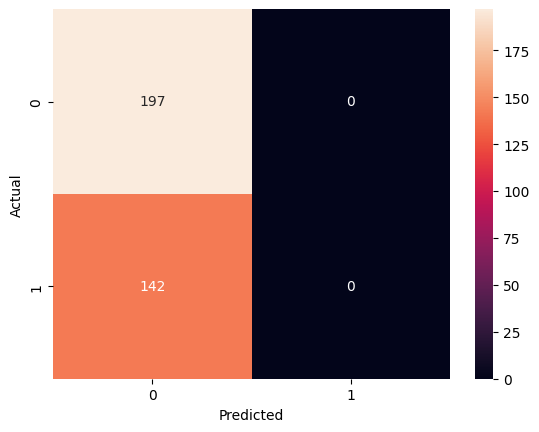

Training AUC: 0.5000


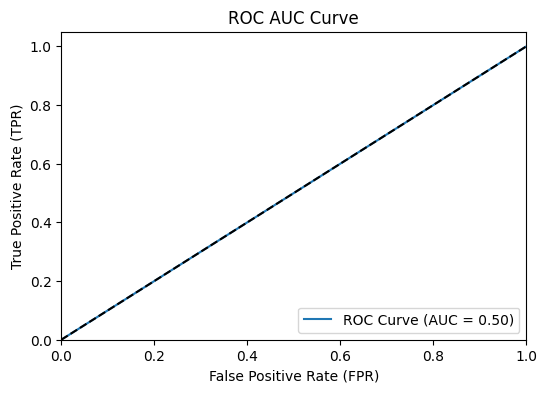

======== Test Set ==========
Accuracy :  0.6206896551724138
Confusion Matrix:
[[90  0]
 [55  0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.62      1.00      0.77        90
           1       0.00      0.00      0.00        55

    accuracy                           0.62       145
   macro avg       0.31      0.50      0.38       145
weighted avg       0.39      0.62      0.48       145



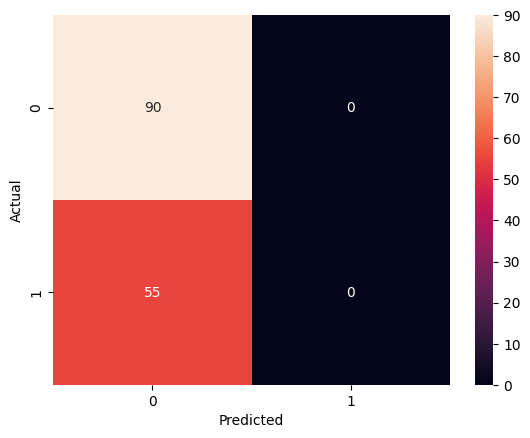

Testing AUC: 0.5000


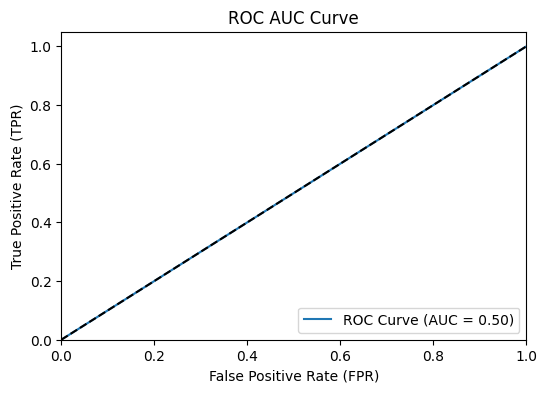

In [31]:
# Create logistic regression model with optimal L1 penalization C value
log_reg_l1 = LogisticRegression(penalty='l1', C=best_c, solver='liblinear')
log_reg_l1.fit(X_train, Y_train)

### Evaluate Model Performance ----------------------------------------------------------------------------------------

# Make predictions on the training and testing sets, also get the prediction probabilities to calculate ROC-AUC
y_pred_train = log_reg_l1.predict(X_train)
y_pred_test = log_reg_l1.predict(X_test)
y_prob_train = log_reg_l1.predict_proba(X_train)[:, 1]
y_prob_test = log_reg_l1.predict_proba(X_test)[:, 1]

# Calculate evaluation metrics and scores for the test and training sets
conf_matrix_train, class_report_train, acc_train = get_scores(Y_train, y_pred_train)
conf_matrix_test, class_report_test, acc_test = get_scores(Y_test, y_pred_test)

# Print scores and evaluation metrics for the training set
print('======== Training Set ==========')
print_our_scores(conf_matrix_train, class_report_train, acc_train)
plot_confusion_matrix(conf_matrix_train) # plot the confusion matrix for the training set using the function we created above

fpr_train, tpr_train, roc_auc_train = get_auc_values(y_prob_train, Y_train)
print(f"Training AUC: {roc_auc_train:.4f}")
plot_roc_curve(fpr_train, tpr_train, roc_auc_train)

# Print scores and evaluation metrics for the test set
print('======== Test Set ==========')
print_our_scores(conf_matrix_test, class_report_test, acc_test)
plot_confusion_matrix(conf_matrix_test) # plot the confusion matrix for the test set using the function we created above

fpr_test, tpr_test, roc_auc_test = get_auc_values(y_prob_test, Y_test)
print(f"Testing AUC: {roc_auc_test:.4f}")
plot_roc_curve(fpr_test, tpr_test, roc_auc_test)


In [209]:
# Logistic regression - L1 penalization model summary

X = data[['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]
y = data['frsdns_1yr']

imputer_sum = IterativeImputer(max_iter=10, random_state=1)
X = imputer_sum.fit_transform(X)

scaler = StandardScaler()
X = scaler.fit_transform(X)

# Add a constant term for the intercept
X = sm.add_constant(X)

# Create and fit logistic regression model
log_reg_l1 = sm.Logit(y, X)
res=log_reg_l1.fit_regularized(method='l1', alpha=best_c)
log_reg_l1 = log_reg_l1.fit(params=res.params)

# Get summary report
summary = log_reg_l1.summary()
print(summary)

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6439412555331844
            Iterations: 147
            Function evaluations: 148
            Gradient evaluations: 147
Optimization terminated successfully.
         Current function value: 0.643884
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:             frsdns_1yr   No. Observations:                  484
Model:                          Logit   Df Residuals:                      448
Method:                           MLE   Df Model:                           35
Date:                Tue, 25 Feb 2025   Pseudo R-squ.:                 0.04717
Time:                        19:21:13   Log-Likelihood:                -311.64
converged:                       True   LL-Null:                       -327.07
Covariance Type:            nonrobust   LLR p-value:                    0.6686
                 coef    std err          z      P>|z

**Model 4 - Categorical naive Bayes classifier**

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as  sns
import plotly.express as px
import numpy as np
import warnings
from sklearn.naive_bayes import CategoricalNB, GaussianNB, MultinomialNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.metrics import RocCurveDisplay, roc_curve, accuracy_score, confusion_matrix, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV

warnings.filterwarnings('ignore')

Converting categorical variables

In [69]:
data_cnb = data

data_cnb['sex'] = data_cnb['sex'].astype("category")
data_cnb['fsa_rural'] = data_cnb['fsa_rural'].astype("category")
data_cnb['ethnicity'] = data_cnb['ethnicity'].astype("category")
data_cnb['immigration'] = data_cnb['immigration'].astype("category")
data_cnb['education'] = data_cnb['education'].astype("category")
data_cnb['employment'] = data_cnb['employment'].astype("category")
data_cnb['income'] = data_cnb['income'].astype("category")
data_cnb['term_delivery'] = data_cnb['term_delivery'].astype("category")
data_cnb['fhx_ns'] = data_cnb['fhx_ns'].astype("category")
data_cnb['fhx_kidney'] = data_cnb['fhx_kidney'].astype("category")
data_cnb['pres_symp_any'] = data_cnb['pres_symp_any'].astype("category")
data_cnb['pres_symp_face_edema'] = data_cnb['pres_symp_face_edema'].astype("category")
data_cnb['pres_symp_periph_edema'] = data_cnb['pres_symp_periph_edema'].astype("category")
data_cnb['pres_symp_abdo_dist'] = data_cnb['pres_symp_abdo_dist'].astype("category")
data_cnb['pres_symp_wt_gain'] = data_cnb['pres_symp_wt_gain'].astype("category")
data_cnb['pres_symp_low_uop'] = data_cnb['pres_symp_low_uop'].astype("category")
data_cnb['asthma'] = data_cnb['asthma'].astype("category")
data_cnb['hayfever'] = data_cnb['hayfever'].astype("category")
data_cnb['eczema'] = data_cnb['eczema'].astype("category")
data_cnb['isaac_score'] = data_cnb['isaac_score'].astype("category")
data_cnb['dx_month'] = data_cnb['hosp_dx'].astype("category")
data_cnb['urine_heme'] = data_cnb['urine_heme'].astype("category")
data_cnb['urine_protein'] = data_cnb['urine_protein'].astype("category")

Splitting the dataset

In [70]:
# Splitting the original dataset into training, validation, and test sets
train_df = data_cnb.sample(frac=0.7, random_state=10)
test_df = data_cnb.drop(train_df.index)

Multiple imputation

In [71]:
train_df_X = train_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]

imputer.fit(train_df_X)
train_df_imp = imputer.transform(train_df_X)

train_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']] = train_df_imp

In [88]:
test_df_X = test_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]

imputer.fit(test_df_X)
test_df_imp = imputer.transform(test_df_X)

test_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']] = test_df_imp

In [89]:
# Splitting the combined validation and test data into two equal parts for validation and testing, respectively
valid_df = test_df.sample(frac = 0.5)
test_df = test_df.drop(valid_df.index)

Model evaluation functions

In [90]:
# Define utility functions for model evaluation

def get_scores(Y, Y_pred):
    """
    Computes various evaluation metrics for model predictions.

    Parameters:
    - Y: Actual target values.
    - Y_pred: Predicted target values by the model.

    Returns:
    - conf_matrix: Confusion matrix showing true positives, true negatives, false positives, and false negatives.
    - class_report: Classification report detailing precision, recall, and F1-score for each class.
    - auc: Area Under the Curve (AUC) value for the model's predictions.
    - acc: Accuracy of the model's predictions.
    """
    conf_matrix = confusion_matrix(Y, Y_pred)
    class_report = classification_report(Y, Y_pred)
    auc = roc_auc_score(Y, Y_pred)
    acc = accuracy_score(Y, Y_pred)

    return conf_matrix, class_report, auc, acc

def print_scores(conf_matrix, class_report, auc, acc):
    """
    Prints the evaluation metrics in a structured format.

    Parameters:
    - conf_matrix: Confusion matrix from get_scores function.
    - class_report: Classification report from get_scores function.
    - auc: AUC value from get_scores function.
    - acc: Accuracy value from get_scores function.
    """
    print('AUC : ', auc)
    print('Accuracy : ', acc)
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

Feature coding

In [92]:
# create list of numerical, categorical features
target_column = ['frsdns_1yr']
categorical_columns = ['sex', 'fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop']
numerical_columns = ['age_dx','birthweight_g', 'fsa_rural', 'immigration', 'employment', 'term_delivery', 'mean_sbp_percentile','mean_dbp_percentile','hb','sodium','urea','albumin','cholesterol','egfr_u25','asthma','hayfever','eczema','hosp_dx', 'urine_heme', 'ethnicity','education','income','isaac_score','dx_month','urine_protein']

In [ ]:
Categorical Naive Bayes model

AUC :  0.8210838635876171
Accuracy :  0.8377581120943953
Confusion Matrix:
[[182  15]
 [ 40 102]]

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.92      0.87       197
           1       0.87      0.72      0.79       142

    accuracy                           0.84       339
   macro avg       0.85      0.82      0.83       339
weighted avg       0.84      0.84      0.83       339



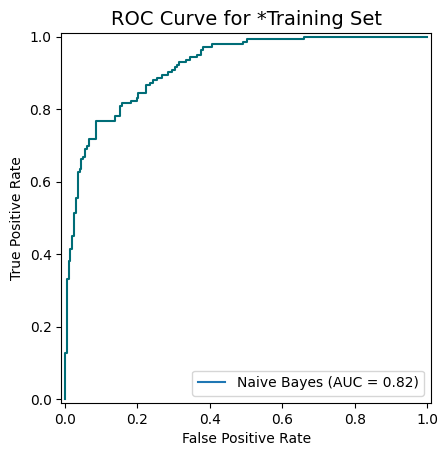

In [93]:
# Initialize the Categorical Naive Bayes model
cnb = CategoricalNB()

# Train the model on training data using all columns
cnb = cnb.fit(
    train_df[categorical_columns + numerical_columns].to_numpy(),
    train_df[target_column]
)

# Predict the target probabilities for the training set
y_hat_prob = cnb.predict_proba(train_df[categorical_columns + numerical_columns])

# Convert probabilities to class labels
y_hat = cnb.predict(train_df[categorical_columns + numerical_columns])

# Evaluate model's performance on the training set
conf_matrix, class_report, auc, acc = get_scores(train_df[target_column], y_hat)

# Print out the evaluation metrics for *training
print_scores(conf_matrix, class_report, auc, acc)

# Visualize the Receiver Operating Characteristic (ROC) curve for *training
fpr, tpr, thresholds = roc_curve(train_df[target_column], y_hat_prob[:, 1])
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='Naive Bayes')
display.plot()
ax = plt.gca()
ax.set_title("ROC Curve for *Training Set", fontsize=14)  #title
ax.get_lines()[0].set_color('#006d77')

AUC :  0.44727272727272727
Accuracy :  0.4444444444444444
Confusion Matrix:
[[11 14]
 [ 6  5]]

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.44      0.52        25
           1       0.26      0.45      0.33        11

    accuracy                           0.44        36
   macro avg       0.46      0.45      0.43        36
weighted avg       0.53      0.44      0.47        36



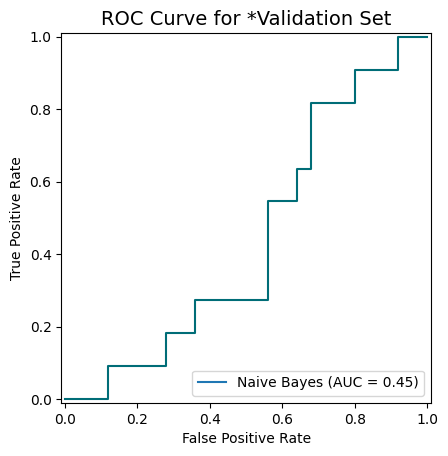

In [94]:
# Predict the target probabilities for the validation set using the extended feature set
y_hat_prob = cnb.predict_proba(valid_df[categorical_columns + numerical_columns])

# Convert probabilities to class labels
y_hat = cnb.predict(valid_df[categorical_columns + numerical_columns])

# Evaluate model's performance on the validation set
conf_matrix, class_report, auc, acc = get_scores(valid_df[target_column], y_hat)

# Print out the evaluation metrics
print_scores(conf_matrix, class_report, auc, acc)

# Visualize the Receiver Operating Characteristic (ROC) curve for the validation set
fpr, tpr, thresholds = roc_curve(valid_df[target_column], y_hat_prob[:, 1])
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='Naive Bayes')
display.plot()
ax = plt.gca()
ax.set_title("ROC Curve for *Validation Set", fontsize=14)  #title
ax.get_lines()[0].set_color('#006d77')

Categorical Naive Bayes with smoothing

AUC :  0.6743404589976406
Accuracy :  0.7197640117994101
Confusion Matrix:
[[188   9]
 [ 86  56]]

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.95      0.80       197
           1       0.86      0.39      0.54       142

    accuracy                           0.72       339
   macro avg       0.77      0.67      0.67       339
weighted avg       0.76      0.72      0.69       339



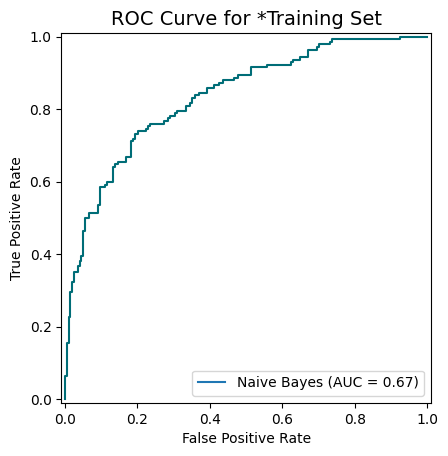

In [95]:
# Initialize the Categorical Naive Bayes model
cnb = CategoricalNB(alpha=10)

# Train the model on training data using all columns
cnb = cnb.fit(
    train_df[categorical_columns + numerical_columns].to_numpy(),
    train_df[target_column]
)

# Predict the target probabilities for the training set
y_hat_prob = cnb.predict_proba(train_df[categorical_columns + numerical_columns])

# Convert probabilities to class labels
y_hat = cnb.predict(train_df[categorical_columns + numerical_columns])

# Evaluate model's performance on the training set
conf_matrix, class_report, auc, acc = get_scores(train_df[target_column], y_hat)

# Print out the evaluation metrics for *training
print_scores(conf_matrix, class_report, auc, acc)

# Visualize the Receiver Operating Characteristic (ROC) curve for *training
fpr, tpr, thresholds = roc_curve(train_df[target_column], y_hat_prob[:, 1])
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='Naive Bayes')
display.plot()
ax = plt.gca()
ax.set_title("ROC Curve for *Training Set", fontsize=14)  #title
ax.get_lines()[0].set_color('#006d77')

AUC :  0.43636363636363634
Accuracy :  0.5
Confusion Matrix:
[[15 10]
 [ 8  3]]

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.60      0.62        25
           1       0.23      0.27      0.25        11

    accuracy                           0.50        36
   macro avg       0.44      0.44      0.44        36
weighted avg       0.52      0.50      0.51        36



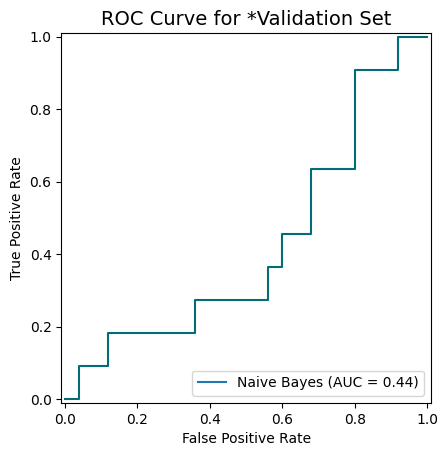

In [96]:
# Predict the target probabilities for the validation set using the extended feature set
y_hat_prob = cnb.predict_proba(valid_df[categorical_columns + numerical_columns])

# Convert probabilities to class labels
y_hat = cnb.predict(valid_df[categorical_columns + numerical_columns])

# Evaluate model's performance on the validation set
conf_matrix, class_report, auc, acc = get_scores(valid_df[target_column], y_hat)

# Print out the evaluation metrics
print_scores(conf_matrix, class_report, auc, acc)

# Visualize the Receiver Operating Characteristic (ROC) curve for the validation set
fpr, tpr, thresholds = roc_curve(valid_df[target_column], y_hat_prob[:, 1])
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='Naive Bayes')
display.plot()
ax = plt.gca()
ax.set_title("ROC Curve for *Validation Set", fontsize=14)  #title
ax.get_lines()[0].set_color('#006d77')

**Model 5 - Decision tree classifier**

In [154]:
import pandas as pd
import numpy as np
import warnings
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
# from sklearn.metrics import RocCurveDisplay, auc, roc_curve
from sklearn.metrics import roc_auc_score, accuracy_score
import plotly.express as px
from category_encoders import OneHotEncoder, TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from xgboost.sklearn import XGBRegressor
from sklearn import tree


warnings.filterwarnings('ignore')

In [128]:
# create list of numerical, categorical features
target_column = ['frsdns_1yr']
categorical_columns = ['sex', 'fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop']
numerical_columns = ['age_dx','birthweight_g', 'fsa_rural', 'immigration', 'employment', 'term_delivery', 'mean_sbp_percentile','mean_dbp_percentile','hb','sodium','urea','albumin','cholesterol','egfr_u25','asthma','hayfever','eczema','hosp_dx', 'urine_heme', 'ethnicity','education','income','isaac_score','dx_month','urine_protein']

Splitting the dataset

In [129]:
# Splitting the original dataset into training, validation sets
train_df = data.sample(frac=0.7, random_state=10)
test_df = data.drop(train_df.index)

Multiple imputation

In [130]:
train_df_X = train_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]

imputer.fit(train_df_X)
train_df_imp = imputer.transform(train_df_X)

train_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']] = train_df_imp

In [131]:
test_df_X = test_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']]

imputer.fit(test_df_X)
test_df_imp = imputer.transform(test_df_X)

test_df.loc[:,['sex','age_dx','fsa_rural','ethnicity','immigration','education','employment','income','term_delivery','birthweight_g','fhx_ns','fhx_kidney','pres_symp_any','pres_symp_face_edema','pres_symp_periph_edema','pres_symp_abdo_dist','pres_symp_wt_gain','pres_symp_low_uop','asthma','hayfever','eczema','isaac_score','dx_month','hosp_dx','mean_sbp_percentile','mean_dbp_percentile','urine_heme','urine_protein','hb','sodium','urea','albumin','cholesterol','egfr_u25']] = test_df_imp

Encoding categorical variables

In [132]:
# Initializing a column transformer that will handle categorical data encoding
ct = ColumnTransformer([('one_hot_encoder', OneHotEncoder(), [c for c in categorical_columns])],remainder='passthrough')

# Initializing a Decision Tree classifier
dt = tree.DecisionTreeClassifier(criterion='entropy',class_weight='balanced')

# Creating a pipeline that first preprocesses the data and then applies the decision tree
model = Pipeline([
    ('pre_process', ct),
    ('DT', dt)
])

In [133]:
# Training the model on the training data
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Predicting and evaluating the model's performance on the training data
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
accuracy_score(train_df['frsdns_1yr'], Y_pred)

1.0

In [134]:
# Predicting and evaluating the model's performance on the test data
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
accuracy_score(test_df['frsdns_1yr'], Y_pred)

0.4689655172413793

Hyperparameter tuning

In [135]:
# Define the hyperparameter values that should be tested
param_dist = {
    "DT__max_depth" : [5, 10, 15, 20 ,25, 30, 35],
    "DT__min_samples_leaf" : [5, 10, 15, 20 ,25],
    "DT__splitter" : ['best', 'random'],
    "DT__max_features" : ['sqrt', 'log2']
}

# Setting up Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5)

# Initialize Grid Search with the model and the hyperparameters to search
random_search = GridSearchCV(
    model, param_grid=param_dist, cv=skf
)

# Train Grid Search on the training data
random_search.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Extract results into a DataFrame
results = pd.DataFrame(random_search.cv_results_)

# Display the set of parameters that achieved the best score
results[results['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_DT__max_depth,param_DT__max_features,param_DT__min_samples_leaf,param_DT__splitter,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
19,0.074132,0.006818,0.020094,0.003364,5,log2,25,random,"{'DT__max_depth': 5, 'DT__max_features': 'log2...",0.691176,0.514706,0.573529,0.558824,0.567164,0.58108,0.058775,1


In [136]:
# Retrieve the best hyperparameters after Grid Search
random_search.best_params_

{'DT__max_depth': 5,
 'DT__max_features': 'log2',
 'DT__min_samples_leaf': 25,
 'DT__splitter': 'random'}

In [137]:
# Update the model's hyperparameters to the best found during Grid Search
model = model.set_params(**random_search.best_params_)

# Refit the model using the training data
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Make predictions on the training set and compute the accuracy
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
train_accuracy = accuracy_score(train_df['frsdns_1yr'], Y_pred)
print(train_accuracy)

# Make predictions on the test set and compute the accuracy
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
test_accuracy = accuracy_score(test_df['frsdns_1yr'], Y_pred)
print(test_accuracy)

0.5752212389380531
0.5448275862068965


In [138]:
conf_matrix = confusion_matrix(test_df['frsdns_1yr'], Y_pred)
class_report = classification_report(test_df['frsdns_1yr'], Y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Confusion Matrix:
[[48 42]
 [24 31]]

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.53      0.59        90
           1       0.42      0.56      0.48        55

    accuracy                           0.54       145
   macro avg       0.55      0.55      0.54       145
weighted avg       0.57      0.54      0.55       145



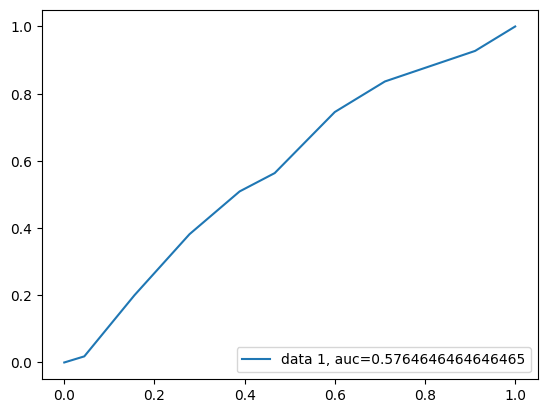

In [140]:
# ROC curve
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))

y_pred_proba = model.predict_proba(test_df.drop('frsdns_1yr', axis=1))[::,1]
fpr, tpr, _ = roc_curve(test_df['frsdns_1yr'],  y_pred_proba)
auc = roc_auc_score(test_df['frsdns_1yr'], y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

**Model 6 - Random forest classifier**

In [141]:
ct = ColumnTransformer([('one_hot_encoder', OneHotEncoder(), [c for c in categorical_columns])],remainder='passthrough')

random_forest = RandomForestClassifier(criterion='entropy', class_weight='balanced_subsample', oob_score=True)

model = Pipeline([
    ('pre_process', ct),
    ('random_forest', random_forest)
])

# Display the pipeline architecture
model

Pipeline(steps=[('pre_process',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('one_hot_encoder',
                                                  OneHotEncoder(),
                                                  ['sex', 'fhx_ns',
                                                   'fhx_kidney',
                                                   'pres_symp_any',
                                                   'pres_symp_face_edema',
                                                   'pres_symp_periph_edema',
                                                   'pres_symp_abdo_dist',
                                                   'pres_symp_wt_gain',
                                                   'pres_symp_low_uop'])])),
                ('random_forest',
                 RandomForestClassifier(class_weight='balanced_subsample',
                                        criterion='entropy', oob_score=True))])

In [142]:
# Using the pipeline model to train on the training data.
# Dropping the target column ('suicide_level') from the input features.
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
accuracy_score(train_df['frsdns_1yr'], Y_pred)

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
accuracy_score(test_df['frsdns_1yr'], Y_pred)

0.593103448275862

Hyperparameter tuning

In [143]:
# Setting hyperparameters for Random Forest for the Grid Search.
param_dist = {
    "random_forest__n_estimators" : [200],
    "random_forest__max_depth" : [5, 10, 15],
    "random_forest__min_samples_leaf" : [15, 20 ,25],
    "random_forest__max_features" : ['sqrt']
}

# Initializing stratified K-fold cross-validation. This ensures each fold has the same proportion of target labels as the whole dataset.
skf = StratifiedKFold(n_splits=5)

# Setting up GridSearchCV to search through the parameter space.
# It will evaluate the model for each combination of hyperparameters provided using stratified K-fold cross-validation.
random_search = GridSearchCV(
    model, param_grid=param_dist, cv=skf
)

# Running the GridSearchCV on the training data.
random_search.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Extracting the results of the Grid Search into a DataFrame for analysis.
results = pd.DataFrame(random_search.cv_results_)

# Filtering to get the rows with the best performing hyperparameters.
results[results['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_forest__max_depth,param_random_forest__max_features,param_random_forest__min_samples_leaf,param_random_forest__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
5,0.542311,0.010324,0.032058,0.000849,10,sqrt,25,200,"{'random_forest__max_depth': 10, 'random_fores...",0.602941,0.529412,0.676471,0.441176,0.507463,0.551493,0.081071,1


In [144]:
# Updating the model's hyperparameters with the best parameters identified from the Grid Search.
model = model.set_params(**random_search.best_params_)

# Retraining the model with the updated hyperparameters on the training data.
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Predicting the target variable on the training set and evaluating the model's accuracy.
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
accuracy_score(train_df['frsdns_1yr'], Y_pred)

# Predicting the target variable on the test set and evaluating the model's accuracy.
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
accuracy_score(test_df['frsdns_1yr'], Y_pred)

0.593103448275862

In [145]:
conf_matrix = confusion_matrix(test_df['frsdns_1yr'], Y_pred)
class_report = classification_report(test_df['frsdns_1yr'], Y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Confusion Matrix:
[[55 35]
 [24 31]]

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.61      0.65        90
           1       0.47      0.56      0.51        55

    accuracy                           0.59       145
   macro avg       0.58      0.59      0.58       145
weighted avg       0.61      0.59      0.60       145



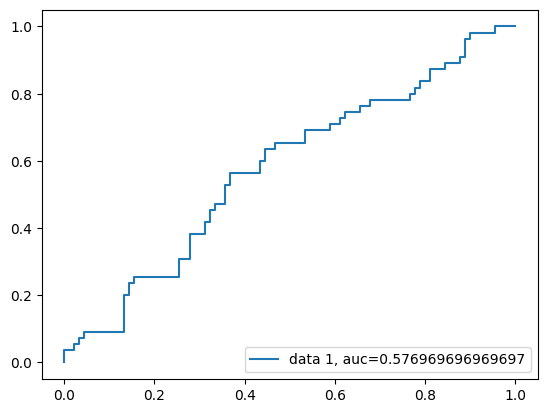

In [146]:
# ROC curve
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))

y_pred_proba = model.predict_proba(test_df.drop('frsdns_1yr', axis=1))[::,1]
fpr, tpr, _ = roc_curve(test_df['frsdns_1yr'],  y_pred_proba)
auc = roc_auc_score(test_df['frsdns_1yr'], y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

**Model 7 - XGBoost**

In [147]:
ct = ColumnTransformer([('one_hot_encoder', OneHotEncoder(), [c for c in categorical_columns])],remainder='passthrough')

xgb = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1)

model = Pipeline([
    ('pre_process', ct),
    ('xg_boost', xgb)
])

In [148]:
# Training the Gradient Boosting model on the training dataset
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Predicting on the training dataset and computing the accuracy
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
accuracy_score(train_df['frsdns_1yr'], Y_pred)

# Predicting on the test dataset and computing the accuracy
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
accuracy_score(test_df['frsdns_1yr'], Y_pred)

0.5103448275862069

In [149]:
# Defining the hyperparameters to be tuned using GridSearchCV
param_dist = {
    "xg_boost__n_estimators" : [100, 200],
    "xg_boost__max_depth" : [1, 5],
    "xg_boost__min_samples_leaf" : [25],
    "xg_boost__learning_rate" : [.1,  .2]
}

# Using StratifiedKFold for cross-validation, ensuring each fold has the same proportion of observations with each target value
skf = StratifiedKFold(n_splits=5)

# Setting up the GridSearchCV to find the best hyperparameters for the Gradient Boosting model
random_search = GridSearchCV(
    model, param_grid=param_dist, cv=skf
)

# Fitting the GridSearchCV on the training data
random_search.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Storing and displaying the results of the grid search
results = pd.DataFrame(random_search.cv_results_)
results[results['rank_test_score'] == 1]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xg_boost__learning_rate,param_xg_boost__max_depth,param_xg_boost__min_samples_leaf,param_xg_boost__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.423903,0.108102,0.043895,0.01485,0.1,1,25,100,"{'xg_boost__learning_rate': 0.1, 'xg_boost__ma...",0.529412,0.544118,0.617647,0.5,0.567164,0.551668,0.039536,1


In [159]:
random_search.best_params_

{'xg_boost__learning_rate': 0.1,
 'xg_boost__max_depth': 1,
 'xg_boost__min_samples_leaf': 25,
 'xg_boost__n_estimators': 100}

In [150]:
# Updating the model's parameters with the best ones found from GridSearchCV
model = model.set_params(**random_search.best_params_)

# Retraining the model with the best parameters on the training dataset
model = model.fit(train_df.drop('frsdns_1yr', axis=1), train_df['frsdns_1yr'])

# Predicting on the training dataset and computing the accuracy
Y_pred = model.predict(train_df.drop('frsdns_1yr', axis=1))
accuracy_score(train_df['frsdns_1yr'], Y_pred)

# Predicting on the test dataset and computing the accuracy
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))
accuracy_score(test_df['frsdns_1yr'], Y_pred)

0.6137931034482759

In [151]:
conf_matrix = confusion_matrix(test_df['frsdns_1yr'], Y_pred)
class_report = classification_report(test_df['frsdns_1yr'], Y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Confusion Matrix:
[[76 14]
 [42 13]]

Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.84      0.73        90
           1       0.48      0.24      0.32        55

    accuracy                           0.61       145
   macro avg       0.56      0.54      0.52       145
weighted avg       0.58      0.61      0.57       145



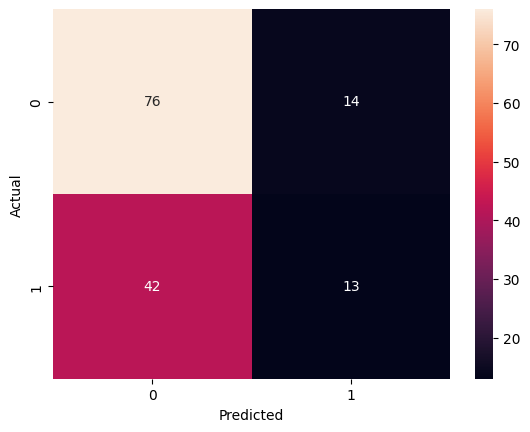

In [153]:
# Visualizing confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

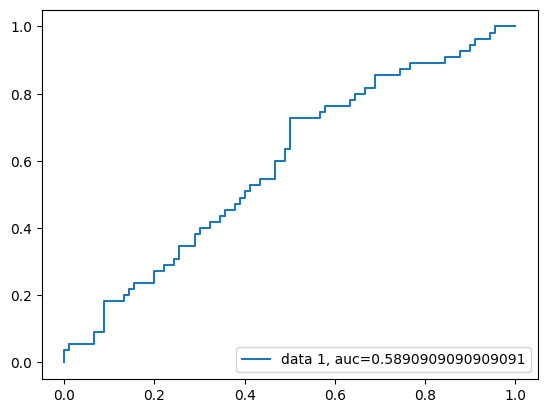

In [152]:
# ROC curve
Y_pred = model.predict(test_df.drop('frsdns_1yr', axis=1))

y_pred_proba = model.predict_proba(test_df.drop('frsdns_1yr', axis=1))[::,1]
fpr, tpr, _ = roc_curve(test_df['frsdns_1yr'],  y_pred_proba)
auc = roc_auc_score(test_df['frsdns_1yr'], y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

**Feature importance - SHAPley additives**

In [156]:
import shap

In [157]:
shap.initjs()

In [161]:
xgb_model = XGBRegressor(n_estimators=100, max_depth=1, learning_rate=0.1, random_state=0)
X_train = train_df.drop('frsdns_1yr', axis=1)
Y_train = train_df['frsdns_1yr']

In [169]:
X_train['sex'] = X_train['sex'].astype("bool")
X_train['fhx_ns'] = X_train['fhx_ns'].astype("bool")
X_train['fhx_kidney'] = X_train['fhx_kidney'].astype("bool")
X_train['pres_symp_any'] = X_train['pres_symp_any'].astype("bool")
X_train['pres_symp_face_edema'] = X_train['pres_symp_face_edema'].astype("bool")
X_train['pres_symp_periph_edema'] = X_train['pres_symp_periph_edema'].astype("bool")
X_train['pres_symp_abdo_dist'] = X_train['pres_symp_abdo_dist'].astype("bool")
X_train['pres_symp_wt_gain'] = X_train['pres_symp_wt_gain'].astype("bool")
X_train['pres_symp_low_uop'] = X_train['pres_symp_low_uop'].astype("bool")

In [171]:
xgb_model.fit(X_train, Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=1, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=0, ...)

In [173]:
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train)

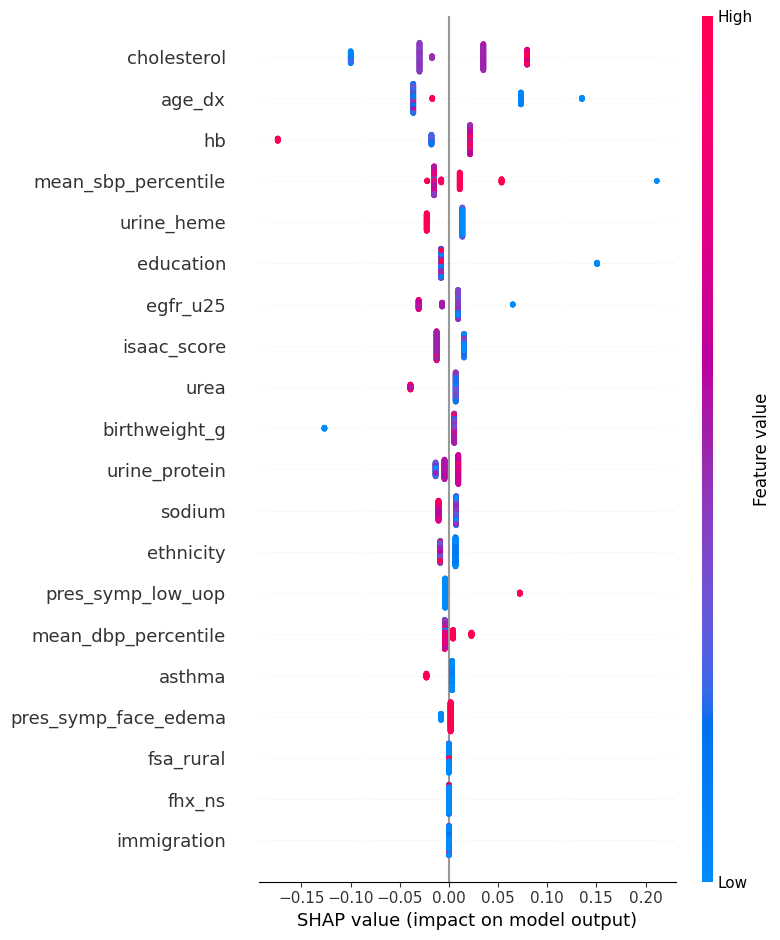

In [174]:
shap.summary_plot(shap_values, features=X_train, feature_names=X_train.columns)